## Advanced Lane Finding Project

The goals / steps of this project are the following:

* [x] Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* [x] Apply a distortion correction to raw images.
* [ ] Use color transforms, gradients, etc., to create a thresholded binary image.
* [ ] Apply a perspective transform to rectify binary image ("birds-eye view").
* [ ] Detect lane pixels and fit to find the lane boundary.
* [ ] Determine the curvature of the lane and vehicle position with respect to center.
* [ ] Warp the detected lane boundaries back onto the original image.
* [ ] Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [21]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
# %matplotlib qt
# %matplotlib inline

nx = 9
ny = 6

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('../camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        orig_img = np.copy(img)
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        
#         offset = 100
#         img_size = (gray.shape[1], gray.shape[0])
        
#         src = np.float32([corners[0], corners[nx-1], corners[-1], corners[-nx]])
#         dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
#                                      [img_size[0]-offset, img_size[1]-offset], 
#                                      [offset, img_size[1]-offset]])
#         M = cv2.getPerspectiveTransform(src, dst)
#         warped = cv2.warpPerspective(undist, M, img_size)
#         print(M)
        
#         cv2.imshow('img',img)
#         plt.imshow(img)
#         cv2.waitKey(500)
        
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

# cv2.destroyAllWindows()


## Apply a distortion correction to raw images.

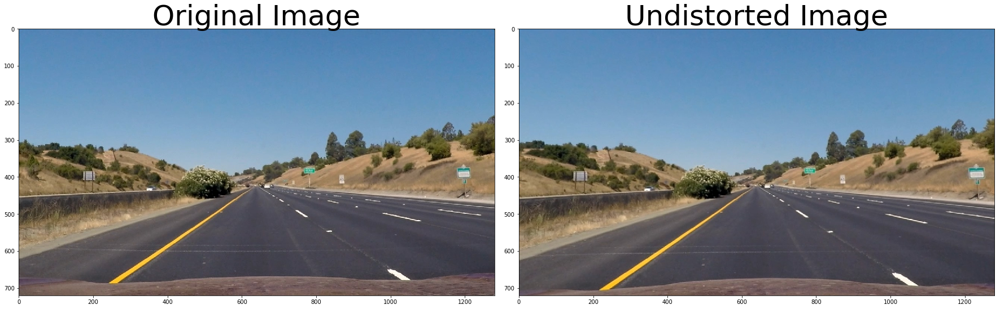

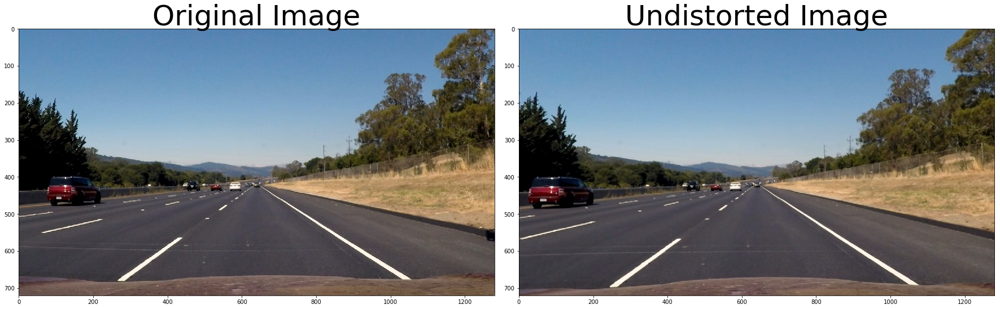

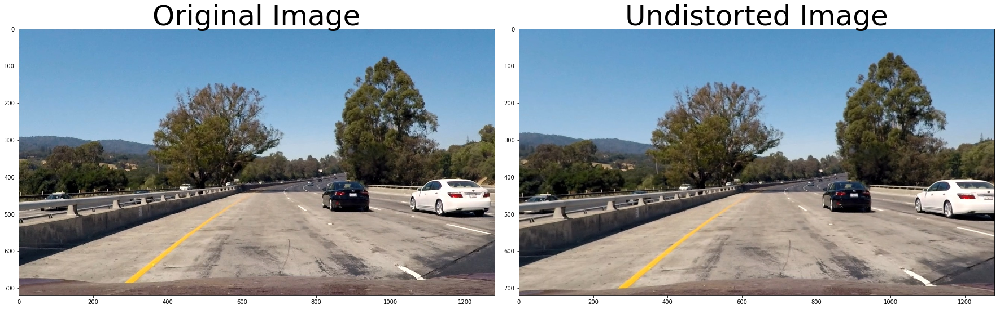

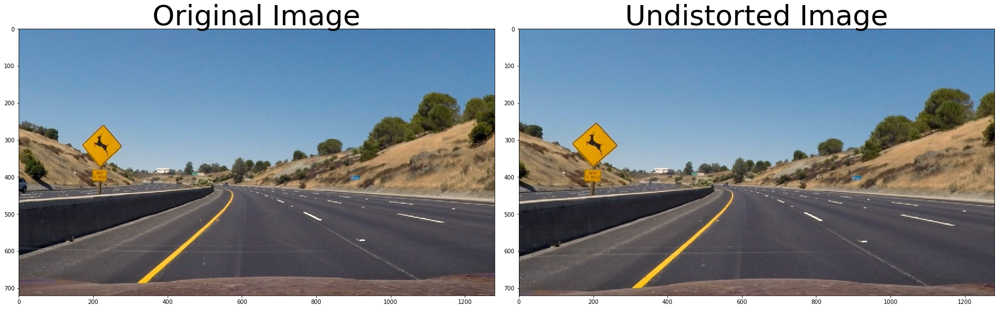

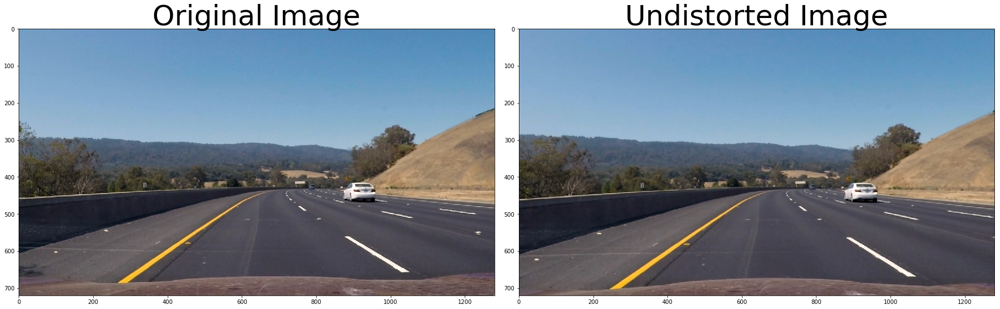

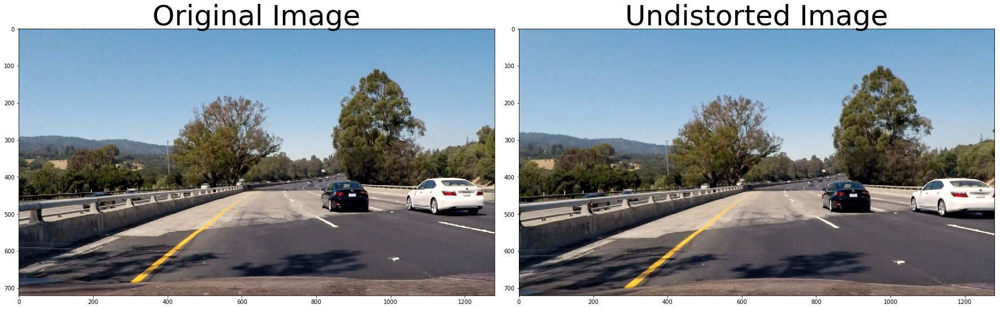

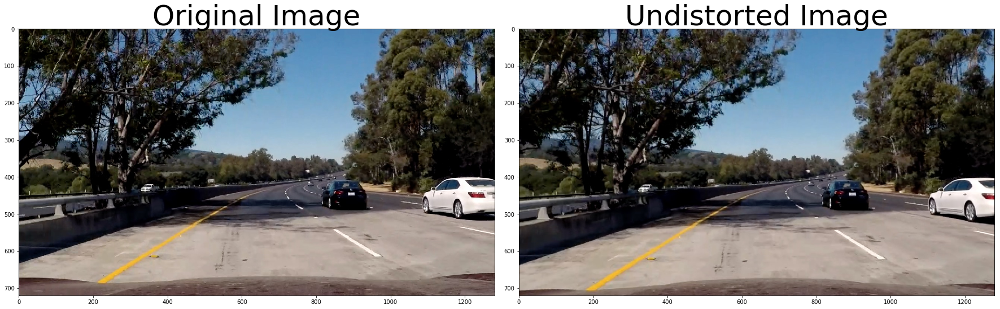

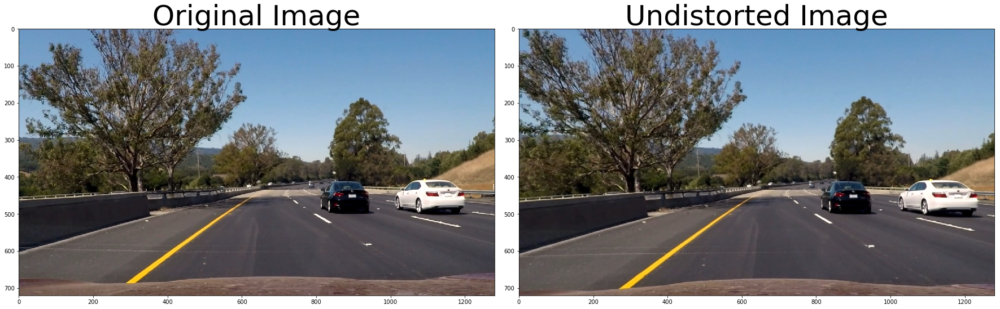

In [22]:
# dst = cv2.undistort(img, mtx, dist, None, mtx)
# plt.imshow(dst)

# Make a list of calibration images
images = glob.glob('../test_images/*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    dst = cv2.undistort(img, mtx, dist, None, mtx)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.savefig('../output_images/' + fname)

## Use color transforms, gradients, etc., to create a thresholded binary image